In [51]:
from google.colab import drive
drive.mount('/drive')

Drive already mounted at /drive; to attempt to forcibly remount, call drive.mount("/drive", force_remount=True).


# Dependencies

In [52]:
!pip install -U ydata-profiling[notebook]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Helper functions

In [53]:
import pandas as pd

PROJECT_PATH = '/drive/MyDrive/Colab Notebooks/Omdena/Bahrain-cryptocurrency'

def find_missing_rows(df, timestamp_col, target_col, freq='H'):
  # Create a reference dataset with complete hourly intervals
  start_timestamp = df[timestamp_col].min()
  end_timestamp = df[timestamp_col].max()
  reference_df = pd.DataFrame({timestamp_col: pd.date_range(start=start_timestamp, end=end_timestamp, freq=freq)})

  df[[timestamp_col]] = df[[timestamp_col]].apply(pd.to_datetime)
  merged_df = pd.merge(reference_df, df, on=timestamp_col, how='outer')
  missing_df = merged_df[merged_df[target_col].isnull()]

  return missing_df


def interpolate_missing_rows(df, timestamp_col, freq='H', interpolation_method='linear'):
  # Create a reference dataset with complete hourly intervals
  start_timestamp = df[timestamp_col].min()
  end_timestamp = df[timestamp_col].max()
  reference_df = pd.DataFrame(index=pd.date_range(start=start_timestamp, end=end_timestamp, freq=freq))

  df[timestamp_col] = pd.to_datetime(df[timestamp_col])
  df = df.set_index(timestamp_col)
  merged_df = reference_df.merge(df, left_index=True, right_index=True, how='left')

  filled_df = merged_df.interpolate(method=interpolation_method)
  filled_df = filled_df.reset_index(names=timestamp_col)

  # Linear interpolation doesn't work with objects like datetime, so we need to interpolate the value of close_time manually
  filled_df['close_time'] = filled_df['open_time'] + pd.Timedelta(hours=1)- pd.Timedelta(milliseconds=1)

  return filled_df

# EDA: BTC Dataset

In [54]:
dataset = 'BTCUSDT'
dataset_name = f'{dataset}_merged'
data = pd.read_csv(PROJECT_PATH + f"/dataset/{dataset_name}.csv")

In [55]:
from ydata_profiling import ProfileReport

profile_report = ProfileReport(data, tsmode=True, title=dataset_name, explorative=True)
profile_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Correlation (with numbers)





<ipython-input-56-ab8cd762b180>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap=plt.cm.Reds, vmin=-1, vmax=1)


<Axes: >

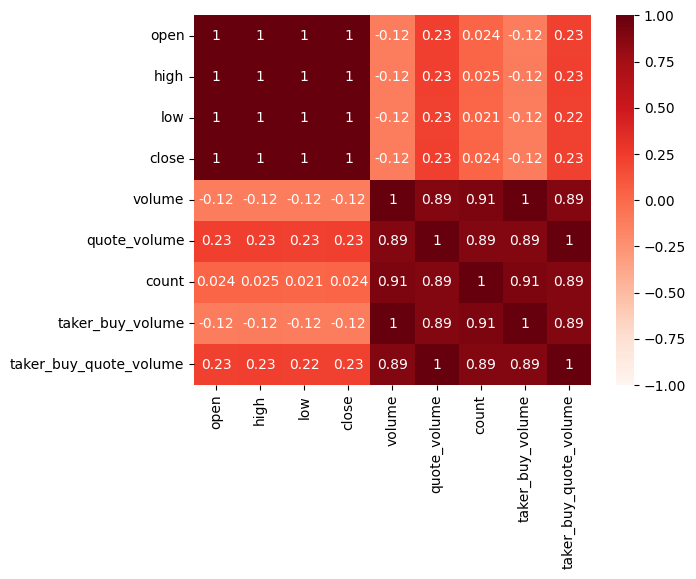

In [56]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(data.corr(), annot=True, cmap=plt.cm.Reds, vmin=-1, vmax=1)


## Check for missing rows

Figure out if there are missing times in our hourly data

In [57]:
original_dataset_size = len(data)
print(f"dataset size: {original_dataset_size}")
missing_rows = find_missing_rows(df=data, timestamp_col='open_time', target_col='close', freq='H')
num_missing_rows = len(missing_rows)
print(f"{num_missing_rows} missing rows found in dataset")
missing_rows.head()

dataset size: 32821
35 missing rows found in dataset


,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
1754,2019-11-13 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1755,2019-11-13 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2042,2019-11-25 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2043,2019-11-25 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3866,2020-02-09 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
missing_rows.index.values.tolist()

[1754,
 1755,
 2042,
 2043,
 3866,
 4116,
 4117,
 4118,
 4119,
 4120,
 4450,
 5690,
 5691,
 7226,
 7227,
 7228,
 10950,
 11463,
 11464,
 11465,
 11546,
 12700,
 13250,
 14330,
 14331,
 14453,
 14454,
 14455,
 17090,
 17091,
 17092,
 17093,
 18223,
 18224,
 31213]

## Populate missing rows using linear interpolation

In [59]:
interpolated_dataset = interpolate_missing_rows(df=data, timestamp_col='open_time', freq='H', interpolation_method='linear')
interpolated_dataset_size = len(interpolated_dataset)
print(f"interpolated dataset size: {interpolated_dataset_size}")
sc_result = 'OK' if interpolated_dataset_size == original_dataset_size + num_missing_rows else 'FAILED'
print(f"Sanity Check: {sc_result}")
interpolated_dataset.head()

interpolated dataset size: 32856
Sanity Check: OK


,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
0,2019-09-01 00:00:00,9588.74,9630.00,9579.34,9617.06,546.960415,2019-09-01 00:59:59.999,5.257943e+06,7428.0,261.131656,2.510480e+06
1,2019-09-01 01:00:00,9617.06,9642.58,9612.08,9614.99,453.105152,2019-09-01 01:59:59.999,4.362498e+06,5789.0,258.764082,2.491295e+06
2,2019-09-01 02:00:00,9614.99,9616.00,9595.76,9605.78,458.004517,2019-09-01 02:59:59.999,4.400751e+06,5485.0,321.355630,3.088171e+06
3,2019-09-01 03:00:00,9606.12,9624.01,9605.78,9623.02,633.588749,2019-09-01 03:59:59.999,6.092024e+06,5500.0,446.853542,4.296649e+06
4,2019-09-01 04:00:00,9623.02,9630.21,9605.60,9614.46,542.260896,2019-09-01 04:59:59.999,5.216076e+06,5536.0,368.470786,3.544535e+06


### Ensure that all columns are now defined

In [60]:
interpolated_dataset.isnull().any()

open_time                 False
open                      False
high                      False
low                       False
close                     False
volume                    False
close_time                False
quote_volume              False
count                     False
taker_buy_volume          False
taker_buy_quote_volume    False
dtype: bool

In [61]:
interpolated_dataset.to_csv(PROJECT_PATH + f"/dataset/{dataset}_interpolated.csv", index=False)


### Ensure that all columns are now defined

In [62]:
interpolated_dataset.isnull().any()

open_time                 False
open                      False
high                      False
low                       False
close                     False
volume                    False
close_time                False
quote_volume              False
count                     False
taker_buy_volume          False
taker_buy_quote_volume    False
dtype: bool

In [63]:
interpolated_dataset.to_csv(PROJECT_PATH + f"/dataset/{dataset}_interpolated.csv", index=False)


## Visualize non-correlated columns

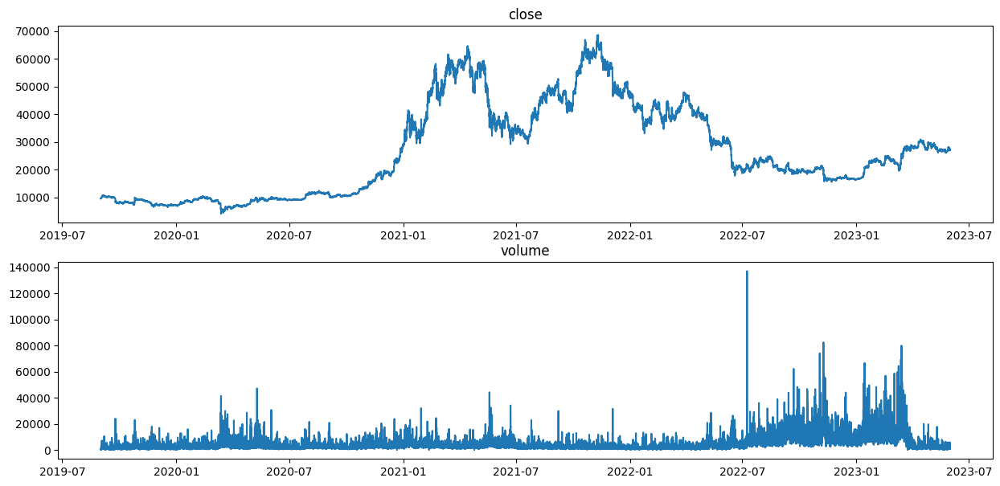

In [64]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
plt.plot(data["open_time"], data["close"])
plt.title("close")

plt.subplot(2, 1, 2)
plt.plot(data["open_time"], data["volume"])
plt.title("volume")

plt.show()



# EDA: ETH Dataset

In [65]:
dataset = 'ETHUSDT'
dataset_name = f'{dataset}_merged'
data = pd.read_csv(PROJECT_PATH + f"/dataset/{dataset_name}.csv")

In [66]:
from ydata_profiling import ProfileReport

profile_report = ProfileReport(data, tsmode=True, title=dataset_name, explorative=True)
profile_report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Correlation (with numbers)





<ipython-input-67-ab8cd762b180>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, cmap=plt.cm.Reds, vmin=-1, vmax=1)


<Axes: >

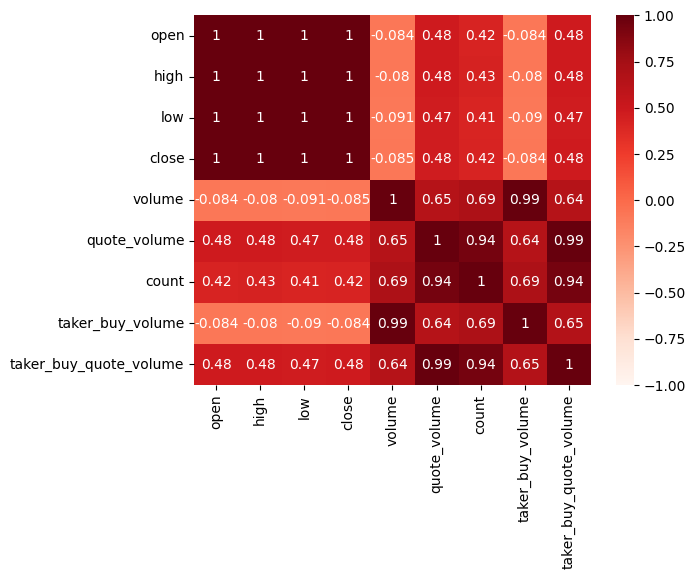

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.heatmap(data.corr(), annot=True, cmap=plt.cm.Reds, vmin=-1, vmax=1)


## Check for missing rows

Figure out if there are missing times in our hourly data

In [68]:
original_dataset_size = len(data)
print(f"dataset size: {original_dataset_size}")
missing_rows = find_missing_rows(df=data, timestamp_col='open_time', target_col='close', freq='H')
num_missing_rows = len(missing_rows)
print(f"{num_missing_rows} missing rows found in dataset")
missing_rows.head()

dataset size: 32821
35 missing rows found in dataset


,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
1754,2019-11-13 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1755,2019-11-13 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2042,2019-11-25 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2043,2019-11-25 03:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3866,2020-02-09 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Populate missing rows using linear interpolation

In [69]:
interpolated_dataset = interpolate_missing_rows(df=data, timestamp_col='open_time', freq='H', interpolation_method='linear')
interpolated_dataset_size = len(interpolated_dataset)
print(f"interpolated dataset size: {interpolated_dataset_size}")
sc_result = 'OK' if interpolated_dataset_size == original_dataset_size + num_missing_rows else 'FAILED'
print(f"Sanity Check: {sc_result}")
interpolated_dataset.head()

interpolated dataset size: 32856
Sanity Check: OK


,open_time,open,high,low,close,volume,close_time,quote_volume,count,taker_buy_volume,taker_buy_quote_volume
0,2019-09-01 00:00:00,171.52,172.89,171.36,172.45,5981.16399,2019-09-01 00:59:59.999,1.030126e+06,3753.0,3576.32332,615886.585686
1,2019-09-01 01:00:00,172.47,173.42,172.41,172.71,7929.54701,2019-09-01 01:59:59.999,1.372183e+06,3310.0,5532.93656,957301.238661
2,2019-09-01 02:00:00,172.67,172.97,172.02,172.43,2650.04457,2019-09-01 02:59:59.999,4.568114e+05,2666.0,1333.25886,229852.921103
3,2019-09-01 03:00:00,172.41,172.83,172.32,172.57,2676.49085,2019-09-01 03:59:59.999,4.618308e+05,2612.0,1445.60395,249450.124375
4,2019-09-01 04:00:00,172.50,172.74,172.11,172.46,2596.85893,2019-09-01 04:59:59.999,4.476401e+05,2848.0,1524.31952,262782.612091


### Ensure that all columns are now defined

In [70]:
interpolated_dataset.isnull().any()

open_time                 False
open                      False
high                      False
low                       False
close                     False
volume                    False
close_time                False
quote_volume              False
count                     False
taker_buy_volume          False
taker_buy_quote_volume    False
dtype: bool

In [71]:
interpolated_dataset.to_csv(PROJECT_PATH + f"/dataset/{dataset}_interpolated.csv", index=False)


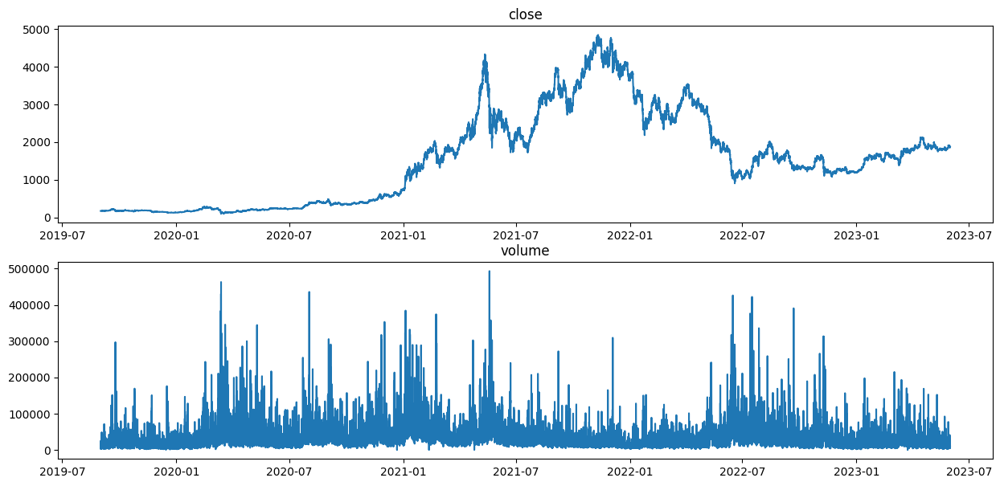

In [72]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 7))

plt.subplot(2, 1, 1)
plt.plot(data["open_time"], data["close"])
plt.title("close")

plt.subplot(2, 1, 2)
plt.plot(data["open_time"], data["volume"])
plt.title("volume")

plt.show()

In [73]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf